<a href="https://colab.research.google.com/github/aayushmanda/da6401_assignment2/blob/main/da6401_1A.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Problem 1

In [ ]:
!wget https://storage.googleapis.com/wandb_datasets/nature_12K.zip

--2025-04-14 17:36:15--  https://storage.googleapis.com/wandb_datasets/nature_12K.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.152.207, 108.177.121.207, 209.85.145.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.152.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3816687935 (3.6G) [application/zip]
Saving to: ‘nature_12K.zip’

nature_12K.zip      100%[===================>]   3.55G  84.2MB/s    in 32s     

2025-04-14 17:36:47 (112 MB/s) - ‘nature_12K.zip’ saved [3816687935/3816687935]



In [ ]:
!unzip nature_12K.zip

In [ ]:
train_dir='inaturalist_12K/train/'
test_dir='inaturalist_12K/val/'
categories=['Amphibia','Animalia','Arachnida','Aves','Fungi','Insecta','Mammalia','Mollusca','Plantae','Reptilia']



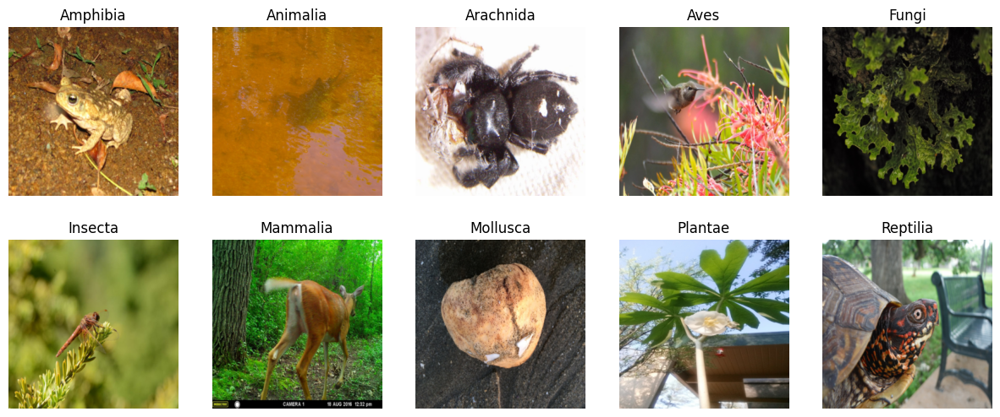

In [ ]:
import torch
import torchvision
import torch.nn as nn
from torchvision.io import read_image
from torchvision.transforms import Resize, ToPILImage
import matplotlib.pyplot as plt
import os

# Initialize figure
fig = plt.figure(figsize=(15, 6))
rows, columns = 2, 5
i = 1

# Loop through categories
for category in categories:
    dir_path = os.path.join(train_dir, category)

    for img_name in os.listdir(dir_path):
        img_path = os.path.join(dir_path, img_name)

        # Read image using PyTorch
        img_tensor = read_image(img_path)
        # Resize image using torchvision transforms
        resize_transform = Resize((300, 300))
        resized_img_tensor = resize_transform(img_tensor)

        # Convert tensor to PIL image for visualization
        pil_img = ToPILImage()(resized_img_tensor)

        # Add subplot and display image
        fig.add_subplot(rows, columns, i)
        plt.imshow(pil_img)
        plt.axis('off')
        plt.title(category)

        i += 1
        break  # Show only one image per category

plt.show()


In [ ]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split

# Define directories
train_dir = 'inaturalist_12K/train/'
test_dir = 'inaturalist_12K/val/'

# Define transformations with additional augmentations
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ColorJitter(brightness=0.2, contrast=0.2),
        transforms.RandomRotation(15),
        transforms.ToTensor()
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor()
    ]),
}

# Create datasets
image_datasets = {
    'train': datasets.ImageFolder(train_dir, data_transforms['train']),
    'val': datasets.ImageFolder(test_dir, data_transforms['val'])
}

# Split validation dataset into two equal halves
val_dataset = image_datasets['val']
val_size = len(val_dataset)
half_size = val_size // 2  # Integer division to split evenly
# If val_size is odd, one half will have one more sample
val_half1, val_half2 = random_split(val_dataset, [half_size, val_size - half_size])

# Create dataloaders for train, val_half1, and val_half2
dataloaders = {
    'train': DataLoader(image_datasets['train'], batch_size=64, shuffle=True, num_workers=2, pin_memory=True),
    'val': DataLoader(val_half1, batch_size=64, shuffle=False, num_workers=2),
    'test': DataLoader(val_half2, batch_size=64, shuffle=False, num_workers=2)
}

# Get dataset sizes and class names
dataset_sizes = {
    'train': len(image_datasets['train']),
    'val': len(val_half1),
    'test': len(val_half2)
}
class_names = image_datasets['train'].classes

# Set device for training
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Print summary information
print(f"Training dataset size: {dataset_sizes['train']}")
print(f"Validation half 1 size: {dataset_sizes['val']}")
print(f"Validation half 2 size: {dataset_sizes['test']}")
print(f"Class names: {class_names}")
print(f"Using device: {device}")

Training dataset size: 9999
Validation half 1 size: 1000
Validation half 2 size: 1000
Class names: ['Amphibia', 'Animalia', 'Arachnida', 'Aves', 'Fungi', 'Insecta', 'Mammalia', 'Mollusca', 'Plantae', 'Reptilia']
Using device: cpu


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class FlexibleCNN(nn.Module):
    def __init__(self,
                 input_channels=3,
                 num_classes=10,
                 num_conv_layers=5,
                 conv_filters=32,
                 filter_size=3,
                 activation_func=nn.ReLU,
                 dense_neurons=512,
                 dropout_rate=0.25):

        super().__init__()

        self.conv_blocks = nn.ModuleList()
        in_channels = input_channels

        # Adding convolution-activation-batchnorm-maxpool blocks
        for _ in range(num_conv_layers):
            self.conv_blocks.append(nn.Sequential(
                nn.Conv2d(in_channels=in_channels, out_channels=conv_filters,
                          kernel_size=filter_size, stride=1, padding=filter_size//2),
                nn.BatchNorm2d(conv_filters),  # Adding Batch Normalization
                activation_func(),
                nn.MaxPool2d(kernel_size=2)
                # nn.Dropout2d(0.4)
            ))
            in_channels = conv_filters

        # Flatten layer
        self.flatten = nn.Flatten()

        # Calculating input size for the first fully connected layer
        input_size = conv_filters * (224 // (2**num_conv_layers))**2  # Calculate input size dynamically

        # Fully connected layers with Dropout
        self.fc1 = nn.Linear(input_size, dense_neurons)  # Use calculated input size
        self.dropout = nn.Dropout(dropout_rate)  # Adding Dropout layer
        self.fc2 = nn.Linear(dense_neurons, num_classes)

    def forward(self, x):
        for block in self.conv_blocks:
            x = block(x)
        x = self.flatten(x)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)  # Apply Dropout during training
        x = self.fc2(x)
        return x

# Example instantiation
model = FlexibleCNN(input_channels=3, num_classes=10, num_conv_layers=5,
                    conv_filters=48, filter_size=5, activation_func=nn.ReLU,
                    dense_neurons=512)

print(model)


FlexibleCNN(
  (conv_blocks): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 48, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (1): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (1-4): 4 x Sequential(
      (0): Conv2d(48, 48, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (1): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc1): Linear(in_features=2352, out_features=512, bias=True)
  (dropout): Dropout(p=0.25, inplace=False)
  (fc2): Linear(in_features=512, out_features=10, bias=True)
)


In [ ]:
# !pip install ipython-autotime
# %load_ext autotime

In [ ]:
import numpy as np

### Estimated training time is 10 mins for 5 epoch with batch_size=64

In [ ]:

import torch.optim as optim
import time

# Hyperparameters
num_epochs = 10  # Number of epochs to train
learning_rate = 1e-4  # Learning rate

# Set up the loss function and optimizer
criterion = nn.CrossEntropyLoss()  # Loss function for multi-class classification
optimizer = optim.Adam(model.parameters(), lr=learning_rate)  # Adam optimizer

# Move model to the appropriate device


def initialize_weights(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.Linear):
        nn.init.kaiming_normal_(m.weight, nonlinearity='relu')
        if m.bias is not None:
            nn.init.constant_(m.bias, 0)

model.apply(initialize_weights)

model.to(device)

# Training loop with test evaluation
lossi = []
best_val_acc = 0.0

for epoch in range(num_epochs):
    print(f'Epoch {epoch + 1}/{num_epochs}')
    print('-' * 10)

    # Training and validation phases
    for phase in ['train', 'val']:
        if phase == 'train':
            model.train()
        else:
            model.eval()

        running_loss = 0.0
        running_corrects = 0

        for inputs, labels in dataloaders[phase]:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()

            with torch.set_grad_enabled(phase == 'train'):
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels)

                if phase == 'train':
                    loss.backward()
                    optimizer.step()
                    lossi.append(loss.item())

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / dataset_sizes[phase]
        epoch_acc = running_corrects.double() / dataset_sizes[phase]
        print(f'{phase} Loss: {epoch_loss:.4f} | Acc: {epoch_acc:.4f}')

        # Track best validation accuracy
        if phase == 'val' and epoch_acc > best_val_acc:
            best_val_acc = epoch_acc



Epoch 1/10
----------
train Loss: 2.3496 | Acc: 0.1823
val Loss: 2.0754 | Acc: 0.2550
Epoch 2/10
----------
train Loss: 2.1348 | Acc: 0.2323
val Loss: 2.0094 | Acc: 0.2790
Epoch 3/10
----------
train Loss: 2.0879 | Acc: 0.2514
val Loss: 1.9696 | Acc: 0.3000
Epoch 4/10
----------
train Loss: 2.0621 | Acc: 0.2570
val Loss: 1.9308 | Acc: 0.3250
Epoch 5/10
----------
train Loss: 2.0422 | Acc: 0.2742
val Loss: 1.9221 | Acc: 0.3080
Epoch 6/10
----------
train Loss: 2.0195 | Acc: 0.2728
val Loss: 1.8894 | Acc: 0.3350
Epoch 7/10
----------
train Loss: 1.9993 | Acc: 0.2829
val Loss: 1.8793 | Acc: 0.3220
Epoch 8/10
----------
train Loss: 1.9908 | Acc: 0.2922
val Loss: 1.8708 | Acc: 0.3460
Epoch 9/10
----------
train Loss: 1.9729 | Acc: 0.2981
val Loss: 1.8619 | Acc: 0.3420
Epoch 10/10
----------
train Loss: 1.9661 | Acc: 0.3052
val Loss: 1.8235 | Acc: 0.3600


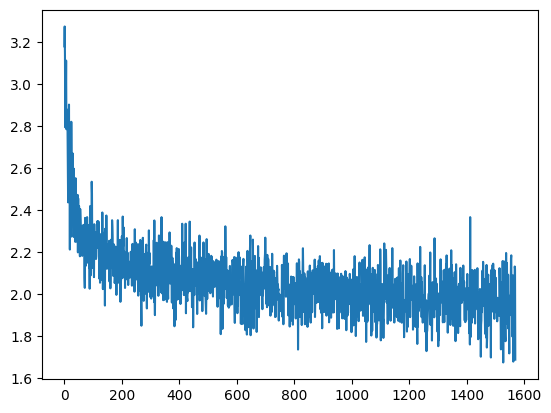

In [ ]:
plt.plot(torch.tensor(lossi))

Attempting to collect 30 samples for the grid...
Processing batch 1/16...
Collected 30 samples.
Plotting results...


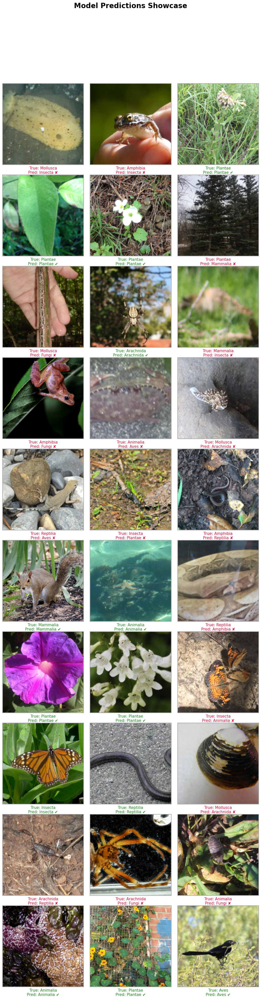

Plotting complete.


In [ ]:
import torchvision
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np
from torch.utils.data import DataLoader

test_loader = dataloaders["test"]
model.eval()  # Set model to evaluation mode

# --- Configuration for the Grid ---
rows = 10
cols = 3
num_samples_to_show = rows * cols
print(f"Attempting to collect {num_samples_to_show} samples for the grid...")

# --- Collect Samples ---
collected_images = []
collected_true_labels = []
collected_preds = []

with torch.no_grad():
    for batch_idx, (images, labels) in enumerate(test_loader):
        print(f"Processing batch {batch_idx + 1}/{len(test_loader)}...")
        images_device, labels_device = images.to(device), labels.to(device)
        outputs = model(images_device)
        _, preds_device = torch.max(outputs, 1)

        # Move needed data back to CPU for storage
        images_cpu = images.cpu()
        labels_cpu = labels.cpu()
        preds_cpu = preds_device.cpu()

        # Add samples from this batch to our lists
        for i in range(len(labels_cpu)):
            if len(collected_images) < num_samples_to_show:
                collected_images.append(images_cpu[i])
                collected_true_labels.append(labels_cpu[i].item())
                collected_preds.append(preds_cpu[i].item())
            else:
                break # Stop collecting within the batch

        # Stop iterating through batches if we have enough samples
        if len(collected_images) >= num_samples_to_show:
            print(f"Collected {len(collected_images)} samples.")
            break # Stop collecting from loader
    else:
        # This runs if the loop finished without breaking (i.e., loader exhausted)
        print(f"Warning: Test loader exhausted. Collected only {len(collected_images)} samples (requested {num_samples_to_show}).")


# --- Plotting the Grid ---
print("Plotting results...")

# Check if any samples were collected
if not collected_images:
    print("No samples collected, cannot plot.")
else:
    # Create figure and axes grid
    # Adjust figsize - especially height to accommodate text below
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3.5, rows * 4.0)) # Increased height slightly

    # Flatten the axes array for easy iteration, handle case of single row/col
    if rows * cols == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for i in range(len(collected_images)):
        ax = axes[i]
        image_tensor = collected_images[i]
        true_idx = collected_true_labels[i]
        pred_idx = collected_preds[i]

        # Prepare image for display (Tensor (C,H,W) -> Numpy (H,W,C))
        img_display = image_tensor.permute(1, 2, 0).numpy()
        img_display = np.clip(img_display, 0, 1) # Ensure valid range [0,1]

        # Display the image
        ax.imshow(img_display)

        # --- Remove ticks, keep border ---
        ax.set_xticks([])
        ax.set_yticks([])
        border_color = 'darkgrey'
        border_width = 1.5
        for spine in ax.spines.values():
            spine.set_edgecolor(border_color)
            spine.set_linewidth(border_width)
            spine.set_visible(True)

        # --- Text Labels BELOW Image ---
        is_correct = (pred_idx == true_idx)
        true_label_str = class_names[true_idx]
        pred_label_str = class_names[pred_idx]
        symbol = "✔" if is_correct else "✘"
        color = 'forestgreen' if is_correct else 'crimson' # Slightly different colors

        # Increased font size for labels
        font_size_labels = 11 # Increased font size

        # Combine labels into a single string with a newline
        label_text = f"True: {true_label_str}\nPred: {pred_label_str} {symbol}"

        # Use ax.set_xlabel to place text below the axes area
        ax.set_xlabel(label_text,
                      color=color,
                      fontsize=font_size_labels,
                      fontweight='normal', # Can set to 'bold' if preferred
                      labelpad=4) # Adjust vertical padding below the image/border

    # Turn off axes for any remaining subplots if fewer samples were collected
    for j in range(len(collected_images), len(axes)):
        axes[j].axis('off')

    # Adjust layout - Fine-tune padding
    plt.tight_layout(pad=1.0, h_pad=2.0, w_pad=1.0) # Adjusted padding

    # Main Title - Larger and Bolder
    main_title_fontsize = 20
    fig.suptitle("Model Predictions Showcase", fontsize=main_title_fontsize, y=1.02, fontweight='bold') # Adjusted y

    # Adjust top/bottom margin if needed
    plt.subplots_adjust(top=0.94, bottom=0.05) # Make space for title and xlabels

    plt.show()
    print("Plotting complete.")



# Guided Backpropagation

In [ ]:
# --- Define FlexibleCNN ---
class FlexibleCNN(nn.Module):
    def __init__(self,
                 input_channels=3,
                 num_classes=10,
                 num_conv_layers=5,
                 conv_filters=32,
                 filter_size=3,
                 activation_func=nn.ReLU,
                 dense_neurons=512,
                 dropout_rate=0.25):
        super().__init__()

        self.conv_blocks = nn.ModuleList()
        in_channels = input_channels

        # Adding convolution-activation-batchnorm-maxpool blocks
        for _ in range(num_conv_layers):
            self.conv_blocks.append(nn.Sequential(
                nn.Conv2d(in_channels=in_channels, out_channels=conv_filters,
                          kernel_size=filter_size, stride=1, padding=filter_size//2),
                nn.BatchNorm2d(conv_filters),
                activation_func(),
                nn.MaxPool2d(kernel_size=2)
            ))
            in_channels = conv_filters

        # Flatten layer
        self.flatten = nn.Flatten()

        # Calculating input size for the first fully connected layer
        input_size = conv_filters * (224 // (2**num_conv_layers))**2

        # Fully connected layers with Dropout
        self.fc1 = nn.Linear(input_size, dense_neurons)
        self.dropout = nn.Dropout(dropout_rate)
        self.fc2 = nn.Linear(dense_neurons, num_classes)

    def forward(self, x):
        for block in self.conv_blocks:
            x = block(x)
        x = self.flatten(x)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x

model = FlexibleCNN(input_channels=3, num_classes=10, num_conv_layers=5,
                    conv_filters=48, filter_size=5, activation_func=nn.ReLU,
                    dense_neurons=512)

print(model)

FlexibleCNN(
  (conv_blocks): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 48, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (1): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (1-4): 4 x Sequential(
      (0): Conv2d(48, 48, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (1): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc1): Linear(in_features=2352, out_features=512, bias=True)
  (dropout): Dropout(p=0.25, inplace=False)
  (fc2): Linear(in_features=512, out_features=10, bias=True)
)


In [ ]:

import torch.optim as optim
import time

# Hyperparameters
num_epochs = 10  # Number of epochs to train
learning_rate = 1e-4  # Learning rate

# Set up the loss function and optimizer
criterion = nn.CrossEntropyLoss()  # Loss function for multi-class classification
optimizer = optim.Adam(model.parameters(), lr=learning_rate)  # Adam optimizer

# Move model to the appropriate device


def initialize_weights(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.Linear):
        nn.init.kaiming_normal_(m.weight, nonlinearity='relu')
        if m.bias is not None:
            nn.init.constant_(m.bias, 0)

model.apply(initialize_weights)

model.to(device)

# Training loop with test evaluation
lossi = []
best_val_acc = 0.0

for epoch in range(num_epochs):
    print(f'Epoch {epoch + 1}/{num_epochs}')
    print('-' * 10)

    # Training and validation phases
    for phase in ['train', 'val']:
        if phase == 'train':
            model.train()
        else:
            model.eval()

        running_loss = 0.0
        running_corrects = 0

        for inputs, labels in dataloaders[phase]:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()

            with torch.set_grad_enabled(phase == 'train'):
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels)

                if phase == 'train':
                    loss.backward()
                    optimizer.step()
                    lossi.append(loss.item())

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / dataset_sizes[phase]
        epoch_acc = running_corrects.double() / dataset_sizes[phase]
        print(f'{phase} Loss: {epoch_loss:.4f} | Acc: {epoch_acc:.4f}')

        # Track best validation accuracy
        if phase == 'val' and epoch_acc > best_val_acc:
            best_val_acc = epoch_acc



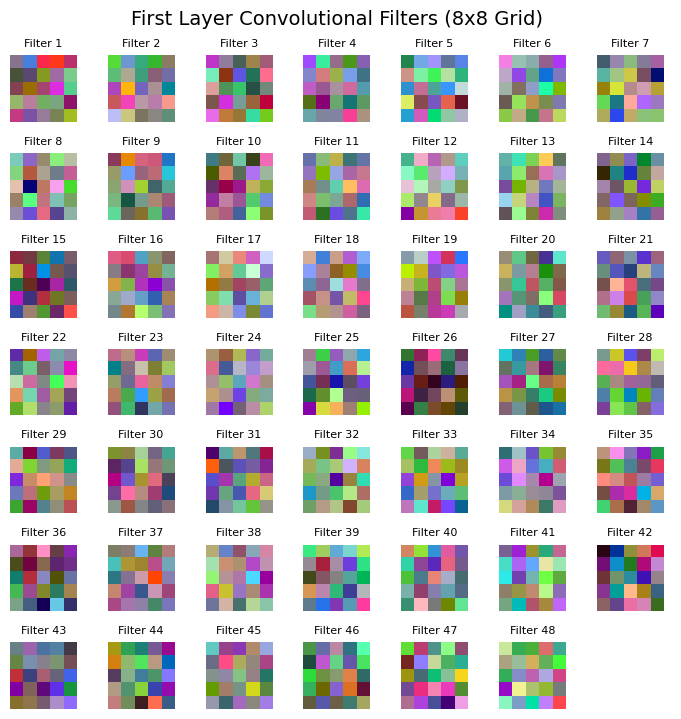

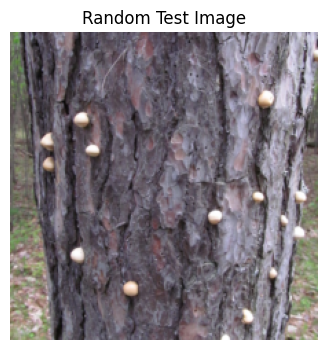

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np



test_loader = dataloaders["test"]


# --- Initialize Model ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.eval()  # Set to evaluation mode

# --- Get Filters from First Conv Layer ---
# The first conv layer is in self.convs[0][0] (first Sequential, first module)
first_conv = model.conv_blocks[0][0]  # nn.Conv2d(3, 64, kernel_size=(3,3))
filters = first_conv.weight.data.cpu().numpy()  # Shape: (64, 3, 3, 3)

# --- Normalize Filters for Visualization ---
# Filters shape: (64, 3, 3, 3) -> Normalize each filter's RGB channels
filters_normalized = np.zeros_like(filters)
for i in range(filters.shape[0]):
    filter_i = filters[i]  # Shape: (3, 3, 3)
    filter_i = (filter_i - filter_i.min()) / (filter_i.max() - filter_i.min() + 1e-8)  # Normalize to [0,1]
    filters_normalized[i] = filter_i

# --- Plot Filters in an 8x8 Grid ---
fig, axes = plt.subplots(7, 7, figsize=(7, 7))
axes = axes.flatten()

for i in range(filters.shape[0]):
    filter_img = filters_normalized[i].transpose(1, 2, 0)  # Shape: (3, 3, 3) -> (3, 3, 3) for imshow
    axes[i].imshow(filter_img)
    axes[i].axis('off')  # Hide axes
    axes[i].set_title(f'Filter {i+1}', fontsize=8)

# Remove any extra subplots (though we have exactly 64)
for i in range(filters.shape[0], len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.suptitle("First Layer Convolutional Filters (8x8 Grid)", fontsize=14, y=1.02)
plt.show()

# --- Optional: Display the Random Test Image ---
data_iter = iter(test_loader)
images, _ = next(data_iter)  # Get one batch (batch_size=1)
image = images[0].cpu().numpy().transpose(1, 2, 0)  # Shape: (3, 32, 32) -> (32, 32, 3)

plt.figure(figsize=(4, 4))
plt.imshow(image)
plt.title("Random Test Image")
plt.axis('off')
plt.show()

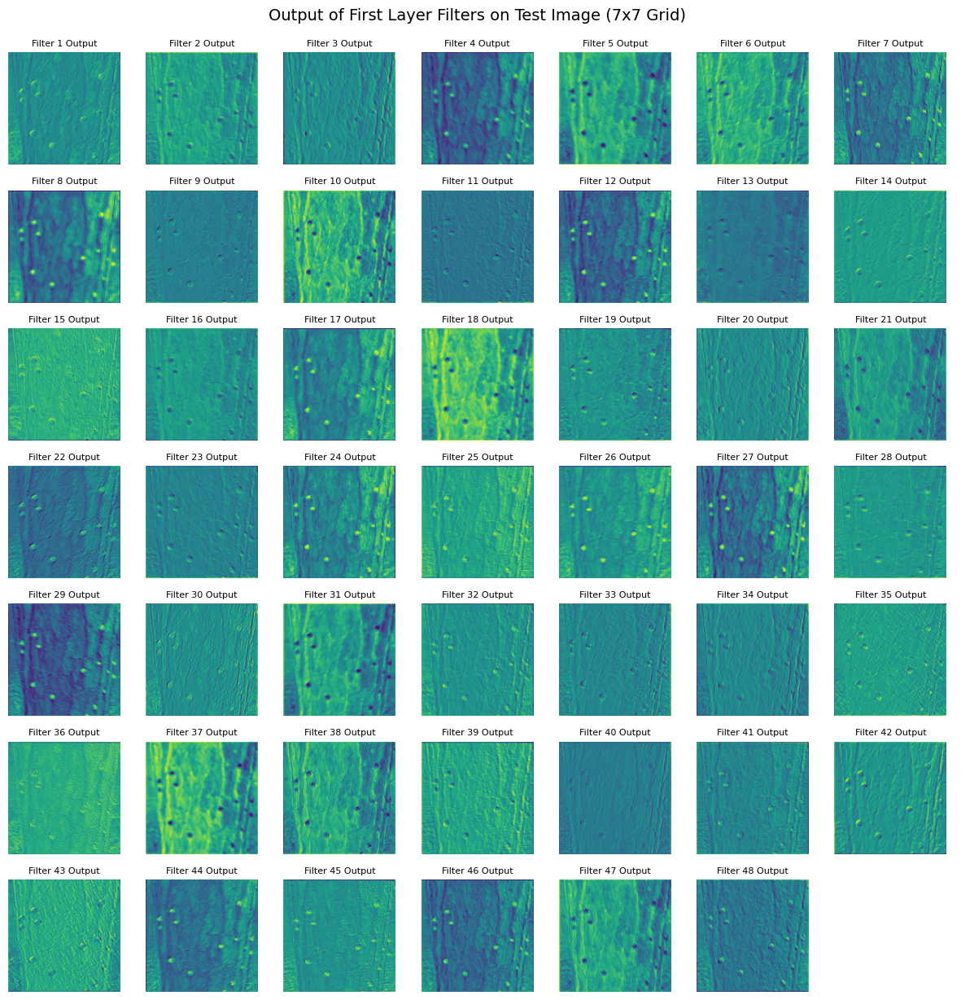

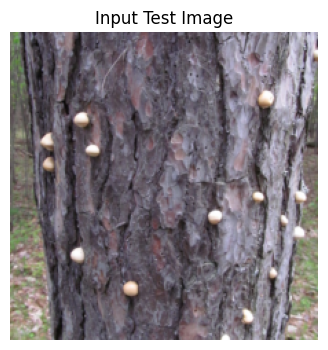

In [ ]:
model.eval()

# --- Get Filters from First Conv Layer ---
first_conv = model.conv_blocks[0][0]  # nn.Conv2d(3, 48, kernel_size=(5,5)) # Corrected filter count
filters = first_conv.weight.data  # Shape: (48, 3, 5, 5) # Corrected filter count

# --- Get a Random Test Image ---
data_iter = iter(dataloaders['test'])
images, _ = next(data_iter)  # Shape: (1, 3, 224, 224)
input_image = images.to(device)

# --- Compute Output for Each Filter ---
outputs = []
with torch.no_grad():
    for i in range(filters.shape[0]): # Iterate over the actual number of filters (48)
        # Extract single filter: shape (out_channels, in_channels, H, W) = (1, 3, 5, 5)
        single_filter = filters[i:i+1]  # Shape: (1, 3, 5, 5)
        # Apply convolution with this filter
        # F.conv2d expects weight shape (out_channels, in_channels, H, W)
        output = F.conv2d(input_image, single_filter, padding=2)  # Shape: (1, 1, 224, 224)
        outputs.append(output[0, 0].cpu().numpy())  # Shape: (224, 224)

# --- Normalize Outputs for Visualization ---
outputs_normalized = np.zeros_like(outputs)
for i in range(len(outputs)):
    output = outputs[i]
    output = (output - output.min()) / (output.max() - output.min() + 1e-8)
    outputs_normalized[i] = output

# --- Plot Outputs in an 8x8 Grid (Adjust if needed) ---
# Since we have 48 filters, we can plot them in a 7x7 grid
fig, axes = plt.subplots(7, 7, figsize=(12, 12)) # Corrected subplot dimensions
axes = axes.flatten()

for i in range(len(outputs)): # Iterate over the actual number of filters (48)
    axes[i].imshow(outputs_normalized[i])
    axes[i].axis('off')
    axes[i].set_title(f'Filter {i+1} Output', fontsize=8)

# Turn off remaining axes (if any)
for i in range(len(outputs), len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.suptitle("Output of First Layer Filters on Test Image (7x7 Grid)", fontsize=14, y=1.02) # Corrected title
plt.show()

# --- Display the Input Image ---
img_display = input_image[0].cpu().numpy().transpose(1, 2, 0)
img_display = np.clip(img_display, 0, 1)
plt.figure(figsize=(4, 4))
plt.imshow(img_display)
plt.title("Input Test Image")
plt.axis('off')
plt.show()

FlexibleCNN Architecture:
 ------------------------------------------------------------ 
 FlexibleCNN(
  (conv_blocks): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 48, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (1): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (1-4): 4 x Sequential(
      (0): Conv2d(48, 48, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (1): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc1): Linear(in_features=2352, out_features=512, bias=True)
  (dropout): Dropout(p=0.25, inplace=False)
  (fc2): Linear(in_features=512, out_features=10, bias=True)
) 
 -------------------------------------------

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


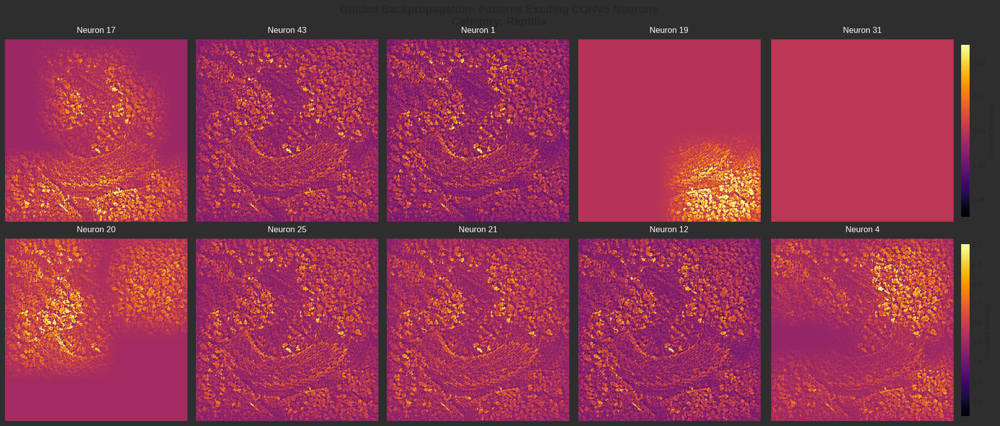

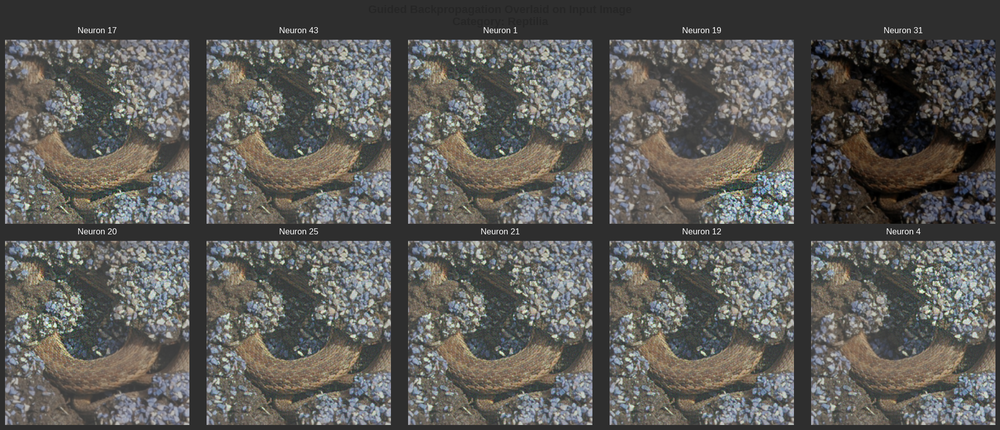

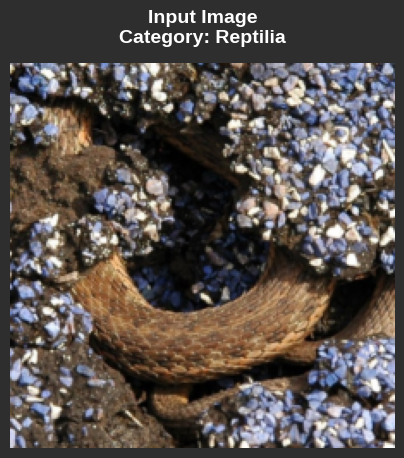

In [ ]:
import seaborn as sns

class_names = image_datasets['train'].classes
num_classes = len(class_names)

# --- Guided Backpropagation Class (unchanged) ---
class GuidedBackprop:
    def __init__(self, model):
        self.model = model
        self.model.eval()
        self.image_reconstruction = None
        self.activation_maps = []
        self.hooks = []
        self.first_layer_hook = None
        self.register_hooks()

    def register_hooks(self):
        def first_layer_hook_fn(module, grad_in, grad_out):
            self.image_reconstruction = grad_in[0]

        def forward_hook_fn(module, input, output):
            self.activation_maps.append(output)

        def backward_hook_fn(module, grad_in, grad_out):
            grad = self.activation_maps.pop()
            grad[grad > 0] = 1
            positive_grad_out = torch.clamp(grad_out[0], min=0.0)
            new_grad_in = positive_grad_out * grad
            return (new_grad_in,)

        for block in self.model.conv_blocks:
            for name, module in block.named_children():
                if isinstance(module, nn.ReLU):
                    self.hooks.append(module.register_forward_hook(forward_hook_fn))
                    self.hooks.append(module.register_backward_hook(backward_hook_fn))

        first_layer = self.model.conv_blocks[0][0]
        self.first_layer_hook = first_layer.register_backward_hook(first_layer_hook_fn)

    def remove_hooks(self):
        for hook in self.hooks:
            hook.remove()
        if self.first_layer_hook:
            self.first_layer_hook.remove()
        self.hooks = []
        self.first_layer_hook = None
        self.activation_maps = []
        self.image_reconstruction = None

    def visualize(self, input_image, target_layer, neuron_idx):
        self.model.zero_grad()
        input_image = input_image.requires_grad_()

        x = input_image
        for i, block in enumerate(self.model.conv_blocks):
            x = block(x)
            if i == target_layer:
                break

        grad = torch.zeros_like(x)
        grad[0, neuron_idx, :, :] = 1.0
        x.backward(gradient=grad)

        if self.image_reconstruction is None:
            raise ValueError("Image reconstruction not captured. Check hook setup.")
        result = self.image_reconstruction.data[0].permute(1, 2, 0)
        return result.numpy()

def normalize(image):
    norm = (image - image.mean()) / (image.std() + 1e-8)
    norm = norm * 0.1
    norm = norm + 0.5
    norm = norm.clip(0, 1)
    return norm

# --- Initialize Model and Guided Backprop ---
print('FlexibleCNN Architecture:\n', '-'*60, '\n', model, '\n', '-'*60)

guided_bp = GuidedBackprop(model)

# --- Select 10 Random Neurons from CONV5 ---
conv5_filters = 48
neuron_indices = random.sample(range(conv5_filters), 10)
print(f"Selected neuron indices in CONV5: {neuron_indices}")

# --- Get a Random Test Image ---
data_iter = iter(dataloaders['test'])
input_image, label = next(data_iter)
label = label[0]
input_image = input_image.to(device)
category = class_names[label.item()]  # Get the category of the input image

# --- Compute Guided Backprop for Each Neuron ---
gradient_images = []
gradient_images_rgb = []  # For overlay
for idx in neuron_indices:
    result = guided_bp.visualize(input_image, target_layer=4, neuron_idx=idx)
    result = normalize(result)
    # Grayscale for heatmap
    grad_img = np.abs(result).max(axis=2)
    gradient_images.append(grad_img)
    # RGB for overlay
    grad_img_rgb = np.dstack((result[:, :, 0], result[:, :, 1], result[:, :, 2]))
    grad_img_rgb -= np.min(grad_img_rgb)
    grad_img_rgb /= grad_img_rgb.max() + 1e-8
    gradient_images_rgb.append(grad_img_rgb)

# --- Prepare the Input Image for Display and Overlay ---
img_display = input_image[0].detach().cpu().numpy().transpose(1, 2, 0)
img_display = np.clip(img_display, 0, 1)

# --- Enhanced Plotting: Heatmaps and Overlays ---
# Set the style for better aesthetics
plt.style.use('seaborn-v0_8-darkgrid')

# 1. Heatmaps in a 2x5 Grid with Colorbar
fig = plt.figure(figsize=(20, 8), constrained_layout=True)
fig.suptitle(f"Guided Backpropagation: Patterns Exciting CONV5 Neurons\nCategory: {category}",
             fontsize=16, fontweight='bold', y=1.05)

for i, (grad_img, neuron_idx) in enumerate(zip(gradient_images, neuron_indices)):
    ax = fig.add_subplot(2, 5, i + 1)
    im = ax.imshow(grad_img, cmap='inferno')  # Vibrant colormap
    ax.set_title(f'Neuron {neuron_idx}', fontsize=12, pad=10, color='white')
    ax.axis('off')
    # Add a colorbar to the last subplot in each row
    if (i + 1) % 5 == 0:
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label='Gradient Intensity')

fig.patch.set_facecolor('#2E2E2E')  # Dark background for contrast
plt.show()

# 2. Overlays in a 2x5 Grid
fig = plt.figure(figsize=(20, 8), constrained_layout=True)
fig.suptitle(f"Guided Backpropagation Overlaid on Input Image\nCategory: {category}",
             fontsize=16, fontweight='bold', y=1.05)

for i, (grad_img_rgb, neuron_idx) in enumerate(zip(gradient_images_rgb, neuron_indices)):
    ax = fig.add_subplot(2, 5, i + 1)
    # Display the input image
    ax.imshow(img_display)
    # Overlay the gradient heatmap with transparency
    ax.imshow(grad_img_rgb, cmap='jet', alpha=0.5)  # Semi-transparent overlay
    ax.set_title(f'Neuron {neuron_idx}', fontsize=12, pad=10, color='white')
    ax.axis('off')

fig.patch.set_facecolor('#2E2E2E')
plt.show()

# 3. Display Original Image with Enhanced Styling
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(111)
ax.imshow(img_display)
ax.set_title(f"Input Image\nCategory: {category}", fontsize=14, fontweight='bold', color='white', pad=15)
ax.axis('off')
fig.patch.set_facecolor('#2E2E2E')
plt.show()

# --- Cleanup Hooks ---
guided_bp.remove_hooks()

```Test Accuracy```

In [ ]:
running_loss = 0.0
running_corrects = 0

for inputs, labels in dataloaders["test"]:
    inputs, labels = inputs.to(device), labels.to(device)
    optimizer.zero_grad()

    with torch.set_grad_enabled(False):
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)

    running_loss += loss.item() * inputs.size(0)
    running_corrects += torch.sum(preds == labels.data)

epoch_loss = running_loss / dataset_sizes[phase]
epoch_acc = running_corrects.double() / dataset_sizes[phase]
print(f'Test Loss: {epoch_loss:.4f} | Test Acc: {epoch_acc:.4f}')

Test Loss: 1.8621 | Test Acc: 0.3580
time: 10.5 s (started: 2025-04-13 22:18:37 +00:00)


### Sweep for training from scratch

In [ ]:
def get_dataloader(augment, train_dir='inaturalist_12K/train/', val_dir='inaturalist_12K/val/'):
    """Loads data, augments if you want. Returns loaders and sizes."""
    # Train transforms: augment or not
    train_tfm = transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor()
    ]) if augment else transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor()
    ])
    # Val is always plain
    val_tfm = transforms.Compose([transforms.Resize(256), transforms.CenterCrop(224), transforms.ToTensor()])

    # Datasets and loaders
    dsets = {
        'train': datasets.ImageFolder(train_dir, train_tfm),
        'val': datasets.ImageFolder(val_dir, val_tfm)
    }
    loaders = {
        'train': DataLoader(dsets['train'], batch_size=32, shuffle=True),
        'val': DataLoader(dsets['val'], batch_size=32, shuffle=False)
    }
    sizes = {k: len(v) for k, v in dsets.items()}
    return loaders, sizes

time: 790 µs (started: 2025-04-13 21:39:07 +00:00)


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

class FlexibleCNN(nn.Module):
    """A flexible CNN that lets you tweak conv layers, filters, and more.
    Inspired by the 'make it work, make it right, make it fast' vibe."""

    def __init__(self,
                 input_channels=3,        # RGB images by default
                 num_classes=10,          # For stuff like CIFAR-10
                 num_conv_layers=5,       # How many conv blocks we stack
                 conv_filters=32,         # Starting filter count
                 filter_size=3,           # Default kernel size
                 activation_func=nn.ReLU, # Activation, ReLU by default
                 dense_neurons=512,       # Size of the dense layer
                 dropout_rate=0.25,       # Dropout to keep things chill
                 batch_norm=True,         # Batch norm or not
                 filter_org='same',       # How filters evolve: 'same', 'double', 'half'
                 kernel_sizes=None,       # Custom kernel sizes per layer
                 last_2_avgpool=False,    # AvgPool for last 2 layers?
                 dp_after_cnn=False):     # Dropout after conv layers?
        super().__init__()

        # If no custom kernel sizes, just use the default for all layers
        if kernel_sizes is None:
            kernel_sizes = [(filter_size, filter_size)] * num_conv_layers

        # Build the conv stack dynamically
        self.convs = nn.ModuleList()
        in_ch = input_channels
        filters = conv_filters

        for i in range(num_conv_layers):
            # Each block: Conv -> (BN) -> Act -> (Dropout) -> Pool
            layers = []
            layers.append(nn.Conv2d(in_ch, filters, kernel_sizes[i],
                                  padding=kernel_sizes[i][0] // 2))  # Keep size with padding
            if batch_norm:
                layers.append(nn.BatchNorm2d(filters))
            layers.append(activation_func())
            if dp_after_cnn:
                layers.append(nn.Dropout2d(dropout_rate))
            # Use AvgPool for last 2 layers if flagged, else MaxPool
            pool = nn.AvgPool2d(2) if (last_2_avgpool and i >= num_conv_layers - 2) else nn.MaxPool2d(2)
            layers.append(pool)

            self.convs.append(nn.Sequential(*layers))

            # Update channels and filters for next layer
            in_ch = filters
            if filter_org == 'double':
                filters *= 2  # Double filters each layer
            elif filter_org == 'half':
                filters = max(filters // 2, 16)  # Halve, but don’t go too low

        # Figure out the size after all the pooling (assuming 224x224 input)
        self.flat_size = in_ch * (224 // (2 ** num_conv_layers)) ** 2

        # Fully connected layers
        self.fc1 = nn.Linear(self.flat_size, num_classes)


    def forward(self, x):
        # Run through the conv stack
        for conv in self.convs:
            x = conv(x)

        # Flatten and go through the dense layers
        x = x.view(x.size(0), -1)  # Flatten the batch
        x = self.fc1(x)            # Final output, no softmax (use it in loss)
        return x



In [ ]:
def get_wandb_run_name(config):
    """Slaps together a run name for wandb."""
    return f"f{config.filter}_{config.filter_organisation}_do{config.drop_out}_ks{'-'.join(str(k[0]) for k in config.kernel_size)}"


In [ ]:
def get_activation(name):
    """Quick activation picker."""
    acts = {'ReLU': nn.ReLU, 'GELU': nn.GELU, 'SiLU': nn.SiLU, 'Mish': nn.Mish}
    return acts[name]

#### Sweep

In [ ]:
import torch.nn.functional as F
import torch.optim as optim
import wandb

def train():
    # Initialize wandb first
    run = wandb.init()
    config = wandb.config  # Access config after init
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    wandb.run.name = get_wandb_run_name(config)

    # initialize model
    model = FlexibleCNN(
        num_conv_layers=3,
        conv_filters=32,
        filter_size=3,
        activation_func=get_activation(config.activation),
        kernel_sizes=config.kernel_size,
        dense_neurons=config.dense_sz,
        dropout_rate=config.drop_out,
        batch_norm=config.batch_normalisation,
        filter_org=config.filter_organisation,
        last_2_avgpool=config.last_2_avgpool,
        dp_after_cnn=config.dp_aft_eachCNN
    )

    model.to(device)

    dataloaders, sizes = get_dataloader(config.data_augmentation)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-4)

    num_epochs = 5
    best_val_acc = 0.0

    for epoch in range(num_epochs):
        print(f'Epoch {epoch + 1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            try:
                for inputs, labels in dataloaders[phase]:
                    inputs, labels = inputs.to(device), labels.to(device)
                    optimizer.zero_grad()

                    with torch.set_grad_enabled(phase == 'train'):
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)

                        if phase == 'train':
                            loss.backward()
                            optimizer.step()

                    running_loss += loss.item() * inputs.size(0)
                    running_corrects += torch.sum(preds == labels.data)

                epoch_loss = running_loss / sizes[phase]
                epoch_acc = running_corrects.double() / sizes[phase]

                print(f'{phase} Loss: {epoch_loss:.4f} | Acc: {epoch_acc:.4f}')

                wandb.log({
                    f'{phase}_loss': epoch_loss,
                    f'{phase}_accuracy': epoch_acc,
                    'epoch': epoch
                })

                if phase == 'val':
                    if epoch_acc > best_val_acc:
                        best_val_acc = epoch_acc
                    wandb.log({'val_accuracy': epoch_acc})

            except NameError:
                print("Error: dataloaders and dataset_sizes must be defined globally")
                wandb.log({'error': 'dataloaders_not_defined'})
                run.finish()
                return

    wandb.log({'best_val_accuracy': best_val_acc})




In [ ]:

# Sweep setup
sweep = {
    "name": "cnn_sweep",
    "method": "bayes",
    "metric": {
        "goal": "max",
        "name": "val_acc"
        },
    "parameters": {
        "filter": {"values": [32]},
        "filter_organisation": {"values": ["double", "same", "half"]},
        "drop_out": {"values": [0.2, 0.3]},
        "batch_normalisation": {"values": [True, False]},
        "data_augmentation": {"values": [True, False]},
        "kernel_size": {"values": [[(3,3), (3,3), (3,3)],
                                  [(3,3), (3,3), (5,5)],
                                  [(9,9), (5,5), (7,7)]]},
        "drop_batch_dense": {"values": ["both", "drop", "batch"]},
        "last_2_avgpool": {"values": [False]},
        "dense_sz": {"values": [256, 512]},
        "dp_aft_eachCNN": {"values": [True]},
        "activation": {"values": ["ReLU", "GELU", "SiLU", "Mish"]}
    }
}

# Run it

wandb.login(key="e6b43dd118f9a14e83fe12c597ad8d06bdfed432")  # Don’t do this in real life!
sweep_id = wandb.sweep(sweep, project="da6401-assignment2")
wandb.agent(sweep_id, train, count=20)
wandb.finish()


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: WARNING Malformed sweep config detected! This may cause your sweep to behave in unexpected ways.
wandb: WARNING To avoid this, please fix the sweep config schema violations below:
wandb: WARNING   Violation 1. 'max' is not one of ['minimize', 'maximize']


Create sweep with ID: letqkeos
Sweep URL: https://wandb.ai/da24s016-indian-institute-of-technology-madras/da6401-assignment2/sweeps/letqkeos


wandb: Agent Starting Run: slywnsrd with config:
wandb: 	activation: ReLU
wandb: 	batch_normalisation: False
wandb: 	data_augmentation: True
wandb: 	dense_sz: 512
wandb: 	dp_aft_eachCNN: True
wandb: 	drop_batch_dense: batch
wandb: 	drop_out: 0.2
wandb: 	filter: 32
wandb: 	filter_organisation: double
wandb: 	kernel_size: [[9, 9], [5, 5], [7, 7]]
wandb: 	last_2_avgpool: False


Epoch 1/5
----------
train Loss: 2.2587 | Acc: 0.1525
val Loss: 2.1786 | Acc: 0.2080
Epoch 2/5
----------
train Loss: 2.1701 | Acc: 0.2097
val Loss: 2.0833 | Acc: 0.2635
Epoch 3/5
----------
train Loss: 2.1280 | Acc: 0.2349
val Loss: 2.0586 | Acc: 0.2755
Epoch 4/5
----------
train Loss: 2.1040 | Acc: 0.2457
val Loss: 2.0157 | Acc: 0.2810
Epoch 5/5
----------
train Loss: 2.0796 | Acc: 0.2524
val Loss: 1.9953 | Acc: 0.3015


best_val_accuracy,▁
epoch,▁▁▃▃▅▅▆▆██
train_accuracy,▁▅▇██
train_loss,█▅▃▂▁
val_accuracy,▁▁▅▅▆▆▆▆██
val_loss,█▄▃▂▁
best_val_accuracy,0.3015
epoch,4
train_accuracy,0.25243
train_loss,2.07957
val_accuracy,0.3015


wandb: Agent Starting Run: e2h2az0x with config:
wandb: 	activation: SiLU
wandb: 	batch_normalisation: False
wandb: 	data_augmentation: True
wandb: 	dense_sz: 512
wandb: 	dp_aft_eachCNN: True
wandb: 	drop_batch_dense: drop
wandb: 	drop_out: 0.2
wandb: 	filter: 32
wandb: 	filter_organisation: half
wandb: 	kernel_size: [[3, 3], [3, 3], [3, 3]]
wandb: 	last_2_avgpool: False


Epoch 1/5
----------
train Loss: 2.2856 | Acc: 0.1251
val Loss: 2.2379 | Acc: 0.1740
Epoch 2/5
----------
train Loss: 2.2319 | Acc: 0.1766
val Loss: 2.1739 | Acc: 0.2190
Epoch 3/5
----------
train Loss: 2.1913 | Acc: 0.1977
val Loss: 2.1382 | Acc: 0.2435
Epoch 4/5
----------
train Loss: 2.1792 | Acc: 0.2117
val Loss: 2.1192 | Acc: 0.2555
Epoch 5/5
----------
train Loss: 2.1640 | Acc: 0.2172
val Loss: 2.0976 | Acc: 0.2660


best_val_accuracy,▁
epoch,▁▁▃▃▅▅▆▆██
train_accuracy,▁▅▇██
train_loss,█▅▃▂▁
val_accuracy,▁▁▄▄▆▆▇▇██
val_loss,█▅▃▂▁
best_val_accuracy,0.266
epoch,4
train_accuracy,0.21722
train_loss,2.16401
val_accuracy,0.266


wandb: Agent Starting Run: amtjp4bl with config:
wandb: 	activation: Mish
wandb: 	batch_normalisation: False
wandb: 	data_augmentation: False
wandb: 	dense_sz: 256
wandb: 	dp_aft_eachCNN: True
wandb: 	drop_batch_dense: both
wandb: 	drop_out: 0.2
wandb: 	filter: 32
wandb: 	filter_organisation: half
wandb: 	kernel_size: [[3, 3], [3, 3], [5, 5]]
wandb: 	last_2_avgpool: False


Epoch 1/5
----------
train Loss: 2.2636 | Acc: 0.1532
val Loss: 2.1910 | Acc: 0.2125
Epoch 2/5
----------
train Loss: 2.1666 | Acc: 0.2253
val Loss: 2.1286 | Acc: 0.2335
Epoch 3/5
----------
train Loss: 2.1123 | Acc: 0.2514
val Loss: 2.0778 | Acc: 0.2735
Epoch 4/5
----------
train Loss: 2.0782 | Acc: 0.2759
val Loss: 2.0355 | Acc: 0.3035
Epoch 5/5
----------
train Loss: 2.0504 | Acc: 0.2920
val Loss: 2.0278 | Acc: 0.3130


best_val_accuracy,▁
epoch,▁▁▃▃▅▅▆▆██
train_accuracy,▁▅▆▇█
train_loss,█▅▃▂▁
val_accuracy,▁▁▂▂▅▅▇▇██
val_loss,█▅▃▁▁
best_val_accuracy,0.313
epoch,4
train_accuracy,0.29203
train_loss,2.05043
val_accuracy,0.313


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 1q0qeq2w with config:
wandb: 	activation: Mish
wandb: 	batch_normalisation: False
wandb: 	data_augmentation: True
wandb: 	dense_sz: 256
wandb: 	dp_aft_eachCNN: True
wandb: 	drop_batch_dense: drop
wandb: 	drop_out: 0.2
wandb: 	filter: 32
wandb: 	filter_organisation: half
wandb: 	kernel_size: [[3, 3], [3, 3], [3, 3]]
wandb: 	last_2_avgpool: False


Epoch 1/5
----------
train Loss: 2.2872 | Acc: 0.1251
val Loss: 2.2484 | Acc: 0.1785
Epoch 2/5
----------
train Loss: 2.2530 | Acc: 0.1667
val Loss: 2.2066 | Acc: 0.1955
Epoch 3/5
----------
train Loss: 2.2247 | Acc: 0.1840
val Loss: 2.1658 | Acc: 0.2275
Epoch 4/5
----------
train Loss: 2.1911 | Acc: 0.2090
val Loss: 2.1181 | Acc: 0.2585
Epoch 5/5
----------
train Loss: 2.1649 | Acc: 0.2214
val Loss: 2.0957 | Acc: 0.2825


best_val_accuracy,▁
epoch,▁▁▃▃▅▅▆▆██
train_accuracy,▁▄▅▇█
train_loss,█▆▄▃▁
val_accuracy,▁▁▂▂▄▄▆▆██
val_loss,█▆▄▂▁
best_val_accuracy,0.2825
epoch,4
train_accuracy,0.22142
train_loss,2.16489
val_accuracy,0.2825


wandb: Agent Starting Run: 8ikuybcz with config:
wandb: 	activation: Mish
wandb: 	batch_normalisation: True
wandb: 	data_augmentation: True
wandb: 	dense_sz: 512
wandb: 	dp_aft_eachCNN: True
wandb: 	drop_batch_dense: drop
wandb: 	drop_out: 0.2
wandb: 	filter: 32
wandb: 	filter_organisation: same
wandb: 	kernel_size: [[3, 3], [3, 3], [3, 3]]
wandb: 	last_2_avgpool: False


Epoch 1/5
----------
train Loss: 2.3648 | Acc: 0.1718
val Loss: 2.0898 | Acc: 0.2415
Epoch 2/5
----------
train Loss: 2.2750 | Acc: 0.1976
val Loss: 2.0735 | Acc: 0.2680
Epoch 3/5
----------
train Loss: 2.2395 | Acc: 0.2083
val Loss: 2.0519 | Acc: 0.2725
Epoch 4/5
----------
train Loss: 2.2210 | Acc: 0.2097
val Loss: 2.0784 | Acc: 0.2765
Epoch 5/5
----------
train Loss: 2.2060 | Acc: 0.2176
val Loss: 2.0273 | Acc: 0.2850


best_val_accuracy,▁
epoch,▁▁▃▃▅▅▆▆██
train_accuracy,▁▅▇▇█
train_loss,█▄▂▂▁
val_accuracy,▁▁▅▅▆▆▇▇██
val_loss,█▆▄▇▁
best_val_accuracy,0.285
epoch,4
train_accuracy,0.21762
train_loss,2.20596
val_accuracy,0.285


wandb: Agent Starting Run: 5z6uk36w with config:
wandb: 	activation: GELU
wandb: 	batch_normalisation: False
wandb: 	data_augmentation: True
wandb: 	dense_sz: 512
wandb: 	dp_aft_eachCNN: True
wandb: 	drop_batch_dense: both
wandb: 	drop_out: 0.2
wandb: 	filter: 32
wandb: 	filter_organisation: double
wandb: 	kernel_size: [[3, 3], [3, 3], [5, 5]]
wandb: 	last_2_avgpool: False


Epoch 1/5
----------
train Loss: 2.2355 | Acc: 0.1720
val Loss: 2.1278 | Acc: 0.2520
Epoch 2/5
----------
train Loss: 2.1620 | Acc: 0.2216
val Loss: 2.0705 | Acc: 0.2900
Epoch 3/5
----------
train Loss: 2.1333 | Acc: 0.2436
val Loss: 2.0568 | Acc: 0.2955
Epoch 4/5
----------
train Loss: 2.1251 | Acc: 0.2476
val Loss: 2.0521 | Acc: 0.2790
Epoch 5/5
----------
train Loss: 2.1182 | Acc: 0.2478
val Loss: 2.0339 | Acc: 0.3015


best_val_accuracy,▁
epoch,▁▁▃▃▅▅▆▆██
train_accuracy,▁▆███
train_loss,█▄▂▁▁
val_accuracy,▁▁▆▆▇▇▅▅██
val_loss,█▄▃▂▁
best_val_accuracy,0.3015
epoch,4
train_accuracy,0.24782
train_loss,2.11824
val_accuracy,0.3015


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: dhjl7eoi with config:
wandb: 	activation: ReLU
wandb: 	batch_normalisation: False
wandb: 	data_augmentation: True
wandb: 	dense_sz: 256
wandb: 	dp_aft_eachCNN: True
wandb: 	drop_batch_dense: batch
wandb: 	drop_out: 0.3
wandb: 	filter: 32
wandb: 	filter_organisation: same
wandb: 	kernel_size: [[9, 9], [5, 5], [7, 7]]
wandb: 	last_2_avgpool: False


Epoch 1/5
----------
train Loss: 2.2948 | Acc: 0.1184
val Loss: 2.2609 | Acc: 0.1790
Epoch 2/5
----------
train Loss: 2.2436 | Acc: 0.1652
val Loss: 2.1936 | Acc: 0.2280
Epoch 3/5
----------
train Loss: 2.2089 | Acc: 0.1846
val Loss: 2.1252 | Acc: 0.2560
Epoch 4/5
----------


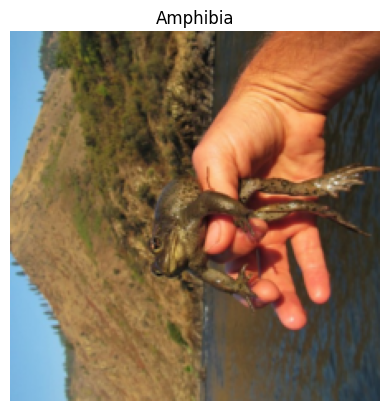

time: 150 ms (started: 2025-04-01 20:01:47 +00:00)


In [ ]:
import matplotlib.pyplot as plt

def visualize_transforms(dataset):
    img, label = dataset[50]  # Get one sample
    plt.imshow(img.permute(2, 1, 0))  # Change from CxHxW to HxWxC for visualization
    plt.title(class_names[label])
    plt.axis('off')
    plt.show()

visualize_transforms(image_datasets['val'])